In [1]:
# First let's import the packages we will use in this project
# You can do this all now or as you need them
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

pd.options.mode.chained_assignment = None

# Now we need to read in the data
df = pd.read_csv('movies.csv')

In [2]:
#let's look at the data
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7663,More to Life,NaN,Drama,2020,"October 23, 2020 (United States)",3.1,18.0,Joseph Ebanks,Joseph Ebanks,Shannon Bond,United States,7000.0,NaN,NaN,90.0
7664,Dream Round,NaN,Comedy,2020,"February 7, 2020 (United States)",4.7,36.0,Dusty Dukatz,Lisa Huston,Michael Saquella,United States,NaN,NaN,Cactus Blue Entertainment,90.0
7665,Saving Mbango,NaN,Drama,2020,"April 27, 2020 (Cameroon)",5.7,29.0,Nkanya Nkwai,Lynno Lovert,Onyama Laura,United States,58750.0,NaN,Embi Productions,NaN
7666,It's Just Us,NaN,Drama,2020,"October 1, 2020 (United States)",NaN,NaN,James Randall,James Randall,Christina Roz,United States,15000.0,NaN,NaN,120.0


In [3]:
# let's see there is any missing data
for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{}-{}%'. format(col, pct_missing))

name-0.0%
rating-0.010041731872717789%
genre-0.0%
year-0.0%
released-0.0002608242044861763%
score-0.0003912363067292645%
votes-0.0003912363067292645%
director-0.0%
writer-0.0003912363067292645%
star-0.00013041210224308815%
country-0.0003912363067292645%
budget-0.2831246739697444%
gross-0.02464788732394366%
company-0.002217005738132499%
runtime-0.0005216484089723526%


In [4]:
df.isnull().sum()

name           0
rating        77
genre          0
year           0
released       2
score          3
votes          3
director       0
writer         3
star           1
country        3
budget      2171
gross        189
company       17
runtime        4
dtype: int64

In [5]:
# data types of our coloumns

df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [6]:
# treating missing data of coloumns

df['budget'].fillna((df['budget'].mean()), inplace=True)
df['score'].fillna((df['score'].mean()), inplace=True)
df['gross'].fillna((df['gross'].mean()), inplace=True)
df['votes'].fillna((df['votes'].mean()), inplace=True)
df['runtime'].fillna((df['runtime'].mean()), inplace=True)

In [7]:
df.dropna(inplace=True)

In [8]:
df.isnull().sum()

name        0
rating      0
genre       0
year        0
released    0
score       0
votes       0
director    0
writer      0
star        0
country     0
budget      0
gross       0
company     0
runtime     0
dtype: int64

In [9]:
# changing data type of coloumns

df['budget']= df['budget'].astype('int64')
df['gross']= df['gross'].astype('int64')
df['votes']= df['votes'].astype('int64')
df['runtime']= df['runtime'].astype('int64')

In [10]:
df.sort_values(by=['gross'],inplace=False, ascending=False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3394,I Want You,R,Crime,1998,"October 30, 1998 (United Kingdom)",6.1,2900,Michael Winterbottom,Eoin McNamee,Rachel Weisz,United Kingdom,35589876,1672,Polygram Filmed Entertainment,87
2906,Pusher,Not Rated,Crime,1996,"August 30, 1996 (Denmark)",7.4,37000,Nicolas Winding Refn,Jens Dahl,Kim Bodnia,Denmark,35589876,1605,Balboa Entertainment,110
3818,"Love, Honor and Obey",R,Comedy,2000,"February 9, 2001 (United States)",6.5,5200,Dominic Anciano,Dominic Anciano,Sadie Frost,United Kingdom,35589876,1400,British Broadcasting Corporation (BBC),103
7580,Run with the Hunted,Not Rated,Crime,2019,"June 26, 2020 (United States)",5.2,735,John Swab,John Swab,Ron Perlman,United States,35589876,682,Roxwell Films,93


In [11]:
pd.set_option('display.max_rows',None)

In [12]:
#let's check duplicate values of columns

df.duplicated().sum()

0

In [13]:
df['year_fix'] = df['released'].astype('str').str.extract('(\d{4})')
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,year_fix
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.400000,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.800000,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.700000,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.700000,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.300000,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98,1980
5,Friday the 13th,R,Horror,1980,"May 9, 1980 (United States)",6.400000,123000,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000,39754601,Paramount Pictures,95,1980
6,The Blues Brothers,R,Action,1980,"June 20, 1980 (United States)",7.900000,188000,John Landis,Dan Aykroyd,John Belushi,United States,27000000,115229890,Universal Pictures,133,1980
7,Raging Bull,R,Biography,1980,"December 19, 1980 (United States)",8.200000,330000,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000,23402427,Chartoff-Winkler Productions,129,1980
8,Superman II,PG,Action,1980,"June 19, 1981 (United States)",6.800000,101000,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000,108185706,Dovemead Films,127,1981
9,The Long Riders,R,Biography,1980,"May 16, 1980 (United States)",7.000000,10000,Walter Hill,Bill Bryden,David Carradine,United States,10000000,15795189,United Artists,100,1980


In [14]:
##df[''].drop_duplicates().sort_values(ascending=False)

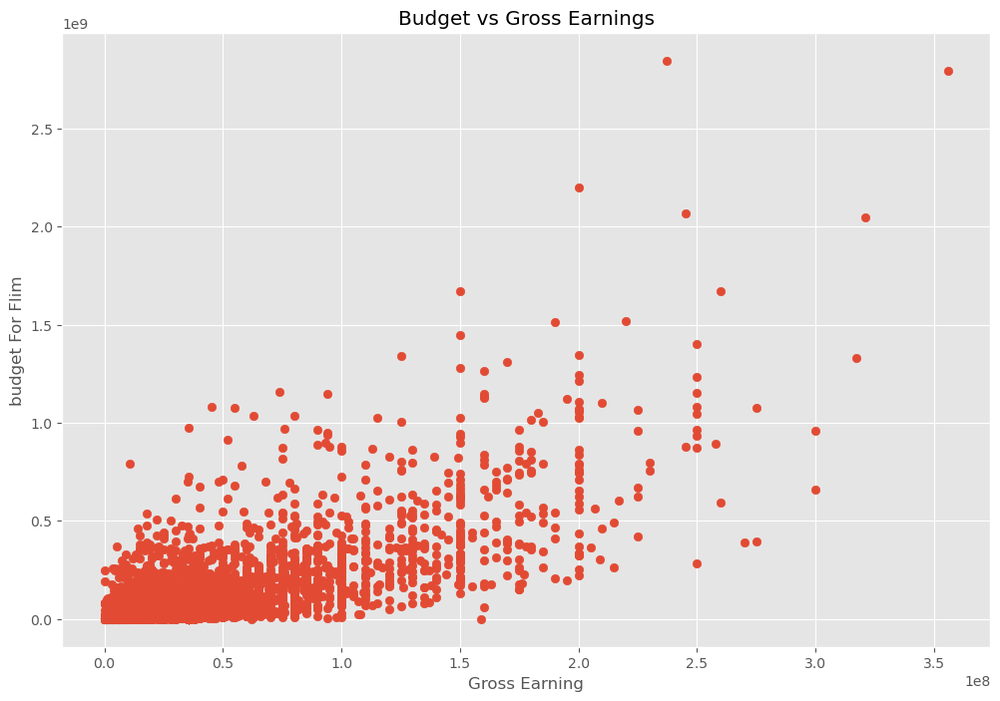

In [15]:
# scatter plot with budget vs gross

plt.scatter(x=df['budget'], y=df['gross'])

plt.title('Budget vs Gross Earnings')

plt.xlabel('Gross Earning')
plt.ylabel('budget For Flim')

plt.show()

<AxesSubplot:xlabel='budget', ylabel='gross'>

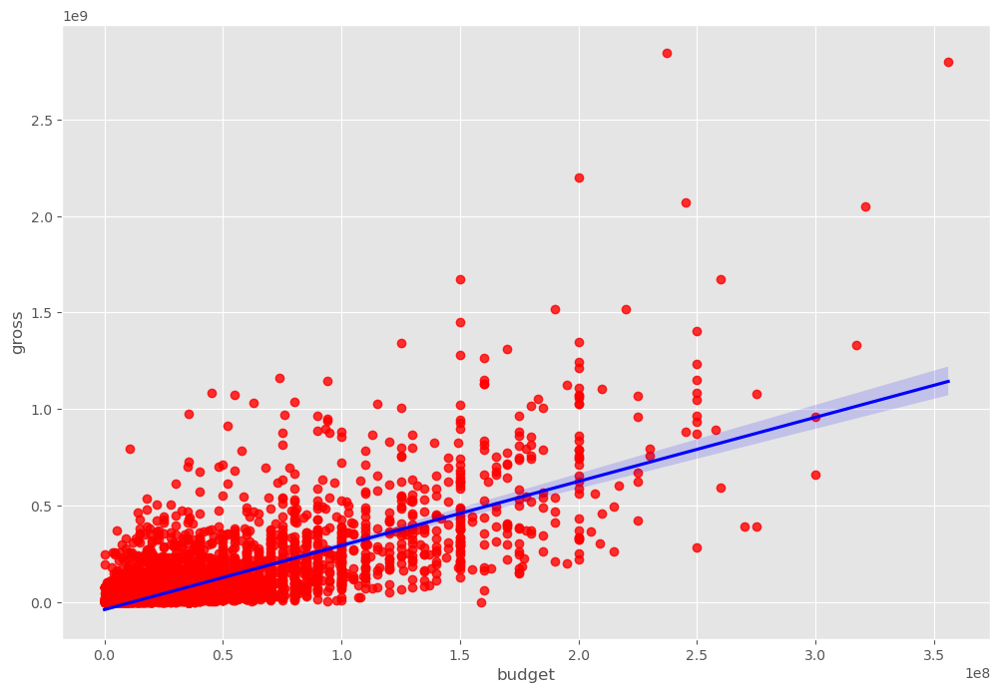

In [16]:
# plot budget vs gross using seaborn

sns.regplot(x='budget', y='gross', data=df, scatter_kws={'color':'red'}, line_kws={'color':'blue'})

In [17]:
# let's start looking at correlation

In [18]:
df.corr()

,year,score,votes,budget,gross,runtime
year,1.000000,0.102154,0.226789,0.268848,0.254159,0.120808
score,0.102154,1.000000,0.411938,0.064654,0.185084,0.400529
votes,0.226789,0.411938,1.000000,0.421218,0.629325,0.309353
budget,0.268848,0.064654,0.421218,1.000000,0.712561,0.265933
gross,0.254159,0.185084,0.629325,0.712561,1.000000,0.241619
runtime,0.120808,0.400529,0.309353,0.265933,0.241619,1.000000


In [19]:
# high correlation between budget and gross

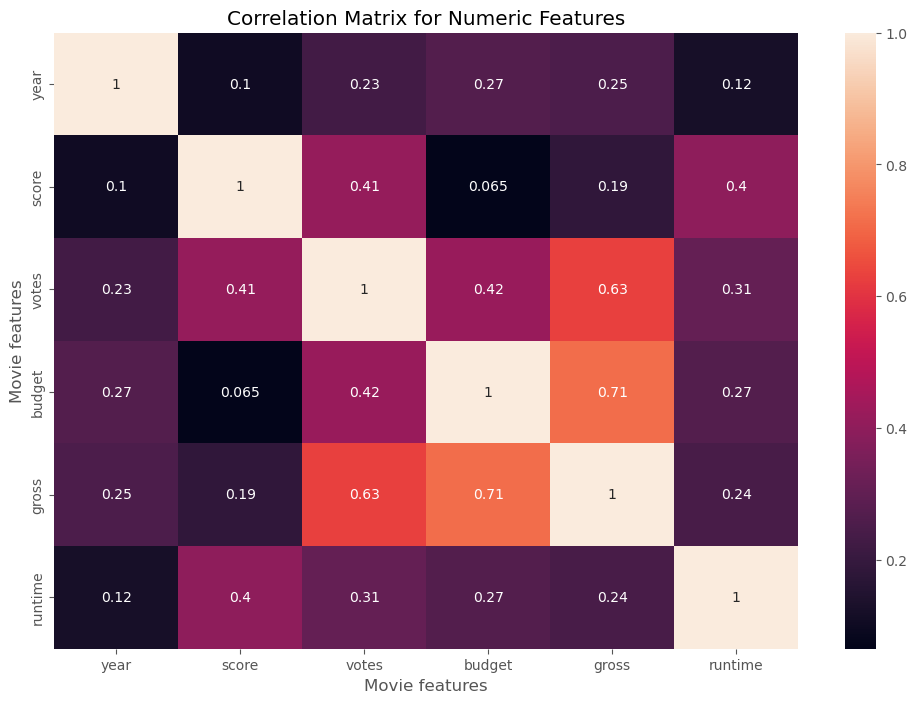

In [20]:
correlation_matrix = df.corr(method='pearson')
sns.heatmap(correlation_matrix, annot=True)

plt.title('Correlation Matrix for Numeric Features')

plt.xlabel('Movie features')
plt.ylabel('Movie features')

plt.show()

In [21]:
df_numerized = df


for col_name in df_numerized.columns:
    if(df_numerized[col_name].dtype == 'object'):
        df_numerized[col_name]= df_numerized[col_name].astype('category')
        df_numerized[col_name] = df_numerized[col_name].cat.codes
        
df_numerized

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,year_fix
0,6508,6,6,1980,1685,8.400000,927000,2545,3960,1022,54,19000000,46998772,2274,146,0
1,5500,6,1,1980,1472,5.800000,65000,2234,1613,316,55,4500000,58853106,710,104,0
2,5075,4,0,1980,1751,8.700000,1200000,1093,2535,1708,55,18000000,538375067,1506,124,0
3,282,4,4,1980,1472,7.700000,221000,1279,1976,2198,55,3500000,83453539,1770,88,0
4,1016,6,4,1980,1523,7.300000,108000,1037,511,398,55,6000000,39846344,1737,98,0
5,2088,6,9,1980,2474,6.400000,123000,2487,4306,234,55,550000,39754601,1770,95,0
6,5501,6,0,1980,1751,7.900000,188000,1390,822,1250,55,27000000,115229890,2237,133,0
7,4376,6,3,1980,691,8.200000,330000,1800,1748,2192,55,18000000,23402427,612,129,0
8,5212,4,0,1980,1733,6.800000,101000,2268,1956,855,55,54000000,108185706,861,127,1
9,6135,6,3,1980,2260,7.000000,10000,2817,413,572,55,10000000,15795189,2228,100,0


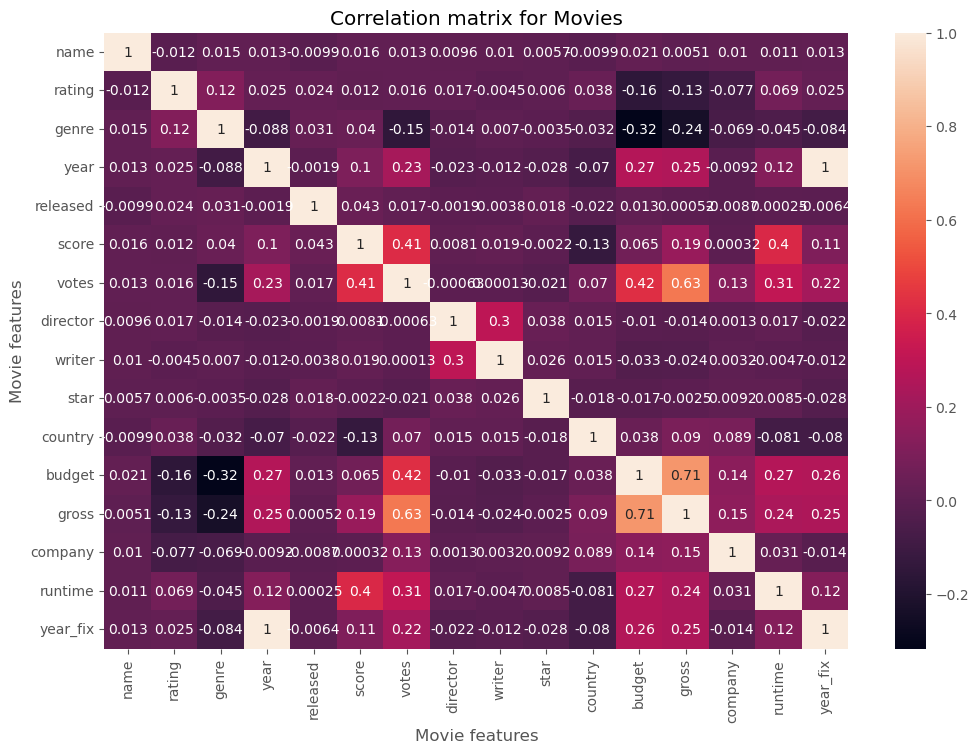

In [22]:
correlation_matrix = df_numerized.corr(method='pearson')

sns.heatmap(correlation_matrix, annot = True)

plt.title("Correlation matrix for Movies")

plt.xlabel("Movie features")

plt.ylabel("Movie features")

plt.show()


In [23]:
df_numerized.corr()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,year_fix
name,1.000000,-0.011944,0.015250,0.013483,-0.009936,0.016160,0.013174,0.009605,0.010271,0.005666,-0.009942,0.020954,0.005071,0.010085,0.011130,0.012680
rating,-0.011944,1.000000,0.117657,0.025120,0.024450,0.011562,0.016092,0.017211,-0.004538,0.005972,0.037765,-0.156385,-0.129384,-0.076860,0.069153,0.025343
genre,0.015250,0.117657,1.000000,-0.088103,0.030843,0.040281,-0.148341,-0.013502,0.006956,-0.003450,-0.031503,-0.316818,-0.238240,-0.068755,-0.044528,-0.084491
year,0.013483,0.025120,-0.088103,1.000000,-0.001890,0.102154,0.226789,-0.022740,-0.012450,-0.027507,-0.070084,0.268848,0.254159,-0.009181,0.120808,0.997468
released,-0.009936,0.024450,0.030843,-0.001890,1.000000,0.043226,0.016870,-0.001867,-0.003831,0.018129,-0.022073,0.013142,0.000520,-0.008693,0.000250,-0.006385
score,0.016160,0.011562,0.040281,0.102154,0.043226,1.000000,0.411938,0.008074,0.018887,-0.002196,-0.130144,0.064654,0.185084,0.000325,0.400529,0.109625
votes,0.013174,0.016092,-0.148341,0.226789,0.016870,0.411938,1.000000,-0.000628,0.000133,-0.020975,0.069563,0.421218,0.629325,0.129579,0.309353,0.222215
director,0.009605,0.017211,-0.013502,-0.022740,-0.001867,0.008074,-0.000628,1.000000,0.297418,0.037564,0.015242,-0.010373,-0.014106,0.001328,0.017403,-0.022072
writer,0.010271,-0.004538,0.006956,-0.012450,-0.003831,0.018887,0.000133,0.297418,1.000000,0.026462,0.014936,-0.033407,-0.023732,0.003174,-0.004659,-0.012145
star,0.005666,0.005972,-0.003450,-0.027507,0.018129,-0.002196,-0.020975,0.037564,0.026462,1.000000,-0.017577,-0.017244,-0.002506,0.009243,0.008550,-0.027922


In [24]:
correlation_mat = df_numerized.corr()

corr_pairs = correlation_mat.unstack()

print(corr_pairs)

name      name        1.000000
          rating     -0.011944
          genre       0.015250
          year        0.013483
          released   -0.009936
          score       0.016160
          votes       0.013174
          director    0.009605
          writer      0.010271
          star        0.005666
          country    -0.009942
          budget      0.020954
          gross       0.005071
          company     0.010085
          runtime     0.011130
          year_fix    0.012680
rating    name       -0.011944
          rating      1.000000
          genre       0.117657
          year        0.025120
          released    0.024450
          score       0.011562
          votes       0.016092
          director    0.017211
          writer     -0.004538
          star        0.005972
          country     0.037765
          budget     -0.156385
          gross      -0.129384
          company    -0.076860
          runtime     0.069153
          year_fix    0.025343
genre   

In [25]:
sorted_pairs = corr_pairs.sort_values()

print(sorted_pairs)

genre     budget     -0.316818
budget    genre      -0.316818
genre     gross      -0.238240
gross     genre      -0.238240
rating    budget     -0.156385
budget    rating     -0.156385
votes     genre      -0.148341
genre     votes      -0.148341
country   score      -0.130144
score     country    -0.130144
rating    gross      -0.129384
gross     rating     -0.129384
genre     year       -0.088103
year      genre      -0.088103
year_fix  genre      -0.084491
genre     year_fix   -0.084491
country   runtime    -0.081418
runtime   country    -0.081418
country   year_fix   -0.080215
year_fix  country    -0.080215
rating    company    -0.076860
company   rating     -0.076860
country   year       -0.070084
year      country    -0.070084
genre     company    -0.068755
company   genre      -0.068755
runtime   genre      -0.044528
genre     runtime    -0.044528
budget    writer     -0.033407
writer    budget     -0.033407
genre     country    -0.031503
country   genre      -0.031503
year_fix

In [26]:
high_corr = sorted_pairs[(sorted_pairs) > 0.5]

print(high_corr)

gross     votes       0.629325
votes     gross       0.629325
budget    gross       0.712561
gross     budget      0.712561
year_fix  year        0.997468
year      year_fix    0.997468
name      name        1.000000
company   company     1.000000
gross     gross       1.000000
budget    budget      1.000000
country   country     1.000000
star      star        1.000000
writer    writer      1.000000
director  director    1.000000
votes     votes       1.000000
score     score       1.000000
released  released    1.000000
year      year        1.000000
genre     genre       1.000000
rating    rating      1.000000
runtime   runtime     1.000000
year_fix  year_fix    1.000000
dtype: float64
